In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import glasbey
import seaborn as sns

import time
import pickle
import memory_profiler

%load_ext memory_profiler
from pathlib import Path

In [ ]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [ ]:
# # FIX VSCODE PATH PROBLEM -- DELETE AFTER
# import sys

# # add path
# sys.path.append(
#     "/gpfs01/berens/user/rgonzalesmarquez/phd/chatgpt-excess-words/scripts/"
# )
# print(sys.path)

In [ ]:
# %load_ext autoreload
# %autoreload 2

# from embeddings_pubmed_utils import plot_tsne_colors

In [ ]:
variables_path = Path("../results/variables")
figures_path = Path("../figures/tmp")
berenslab_data_path = Path("/gpfs01/berens/data/data/pubmed_processed")

In [ ]:
# MANUAL FIX TO PATH ISSUE FROM VSCODE

nb_path = Path(
    "/gpfs01/berens/user/rgonzalesmarquez/phd/chatgpt-excess-words/scripts"
)
assert nb_path.exists(), "The path does not exist"

variables_path = (nb_path / variables_path).resolve(strict=True)
figures_path = (nb_path / figures_path).resolve(strict=True)

In [ ]:
plt.style.use((nb_path / Path("mpl_style.txt")).resolve(strict=True))

# Import data

In [ ]:
%%time
%%memit

df = pd.read_parquet(
    berenslab_data_path / "pubmed_baseline_2025.parquet.gzip",
    engine="pyarrow",
)

peak memory: 90603.61 MiB, increment: 90183.54 MiB
CPU times: user 3min 8s, sys: 35.7 s, total: 3min 44s
Wall time: 2min 8s


In [ ]:
print(df.PMID.iloc[0])
type(df.PMID.iloc[0])

1000


str

In [ ]:
df.head()

,PMID,Title,AbstractText,Journal,Year,Labels,Countries,InferredGenderFirstAuthor,InferredGenderLastAuthor
0,1000,The amino acid sequence of Neurospora NADP-spe...,The NADP-specific glutamate dehydrogenase of N...,The Biochemical journal,1975,unlabeled,unknown,unknown,unknown
1,10000,A new method for the determination of alpha1-p...,Up until now it has been assumed that the prot...,Biochimica et biophysica acta,1976,unlabeled,unknown,unknown,unknown
2,1000017,Development of a short term assay for lymphobl...,Blastic stimulation of lymphocytes by antigens...,Biomedicine / [publiee pour l'A.A.I.C.I.G.],1976,unlabeled,unknown,unknown,unknown
3,1000018,Neonatal polycythemia in low birthweight infant.,74 low birthweight infants haematologic findin...,Biomedicine / [publiee pour l'A.A.I.C.I.G.],1976,unlabeled,unknown,unknown,unknown
4,1000019,Is there evidence for subclasses of chronic ly...,Various clinical and biological parameters wer...,Biomedicine / [publiee pour l'A.A.I.C.I.G.],1976,unlabeled,unknown,unknown,unknown


In [ ]:
abstracts = df["AbstractText"][(df.Year >= 2022) & (df.Year <= 2024)]
labels = df.Labels[(df.Year >= 2022) & (df.Year <= 2024)]
countries = df.Countries[(df.Year >= 2022) & (df.Year <= 2024)]
years = df.Year[(df.Year >= 2022) & (df.Year <= 2024)]

In [ ]:
tsne_sep = np.load(
    variables_path / "tsne_sep.npy",
)

In [ ]:
tsne_rot = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# t-SNE

## Function

In [ ]:
def plot_tsne_colors(
    tsne,
    colors,
    ax=None,
    x_lim=None,
    y_lim=None,
    plot_type=None,
    axis_on=False,
):
    """Plot t-SNE embedding with colors (by labels).

    Parameters
    ----------
    tsne: array-like
        t-SNE coordinates.
    colors : array-like
        Color values for the colormap.
    ax : axes, optional
        Axes where to draw the figure. If ax=None, axes will be created.
    x_lim : tuple (left, right)
        Limits of the x-axis.
    y_lim : tuple (bottom, top)
        Limits of the y-axis.
    plot_type : {None, 'subplot_2', 'subplot_3', 'subplot_3_grey', 'subregion', 'test'}, default=None
        Style of the plot, modifies dotsize and alpha.
    axis_on : bool, default=False
        If True, axis is shown in plot.

    """
    if x_lim is not None:
        assert x_lim[0] < x_lim[1], "xlim values are in the wrong order."
    if y_lim is not None:
        assert y_lim[0] < y_lim[1], "ylim values are in the wrong order."

    assert plot_type in [
        None,
        "subplot_2",
    ], "Not valid `plot_type` value. Choose from [None, 'subplot_2']."

    if ax is None:
        fig, ax = plt.subplots()

    s_grey = 0.5
    s_color = 0.5
    alpha_grey = 0.6
    alpha_color = 0.7

    if plot_type == "subplot_2":
        s_grey = 0.2
        s_color = 0.2

    ax.scatter(
        tsne[:, 0][colors == "lightgrey"],
        tsne[:, 1][colors == "lightgrey"],
        s=s_grey,
        alpha=alpha_grey,
        c="lightgrey",
        marker=".",
        linewidths=0,
        ec="None",
        rasterized=True,
    )
    ax.scatter(
        tsne[:, 0][colors != "lightgrey"],
        tsne[:, 1][colors != "lightgrey"],
        s=s_color,
        alpha=alpha_color,
        c=colors[colors != "lightgrey"],
        marker=".",
        linewidths=0,
        ec="None",
        rasterized=True,
    )

    if plot_type == "subregion":
        ax.axis("scaled")
    else:
        ax.axis("equal")

    ax.set_xlim(x_lim)
    ax.set_ylim(y_lim)

    if axis_on == False:
        ax.axis("off")

## Plots

(-120.0, 120.0, -120.0, 120.0)

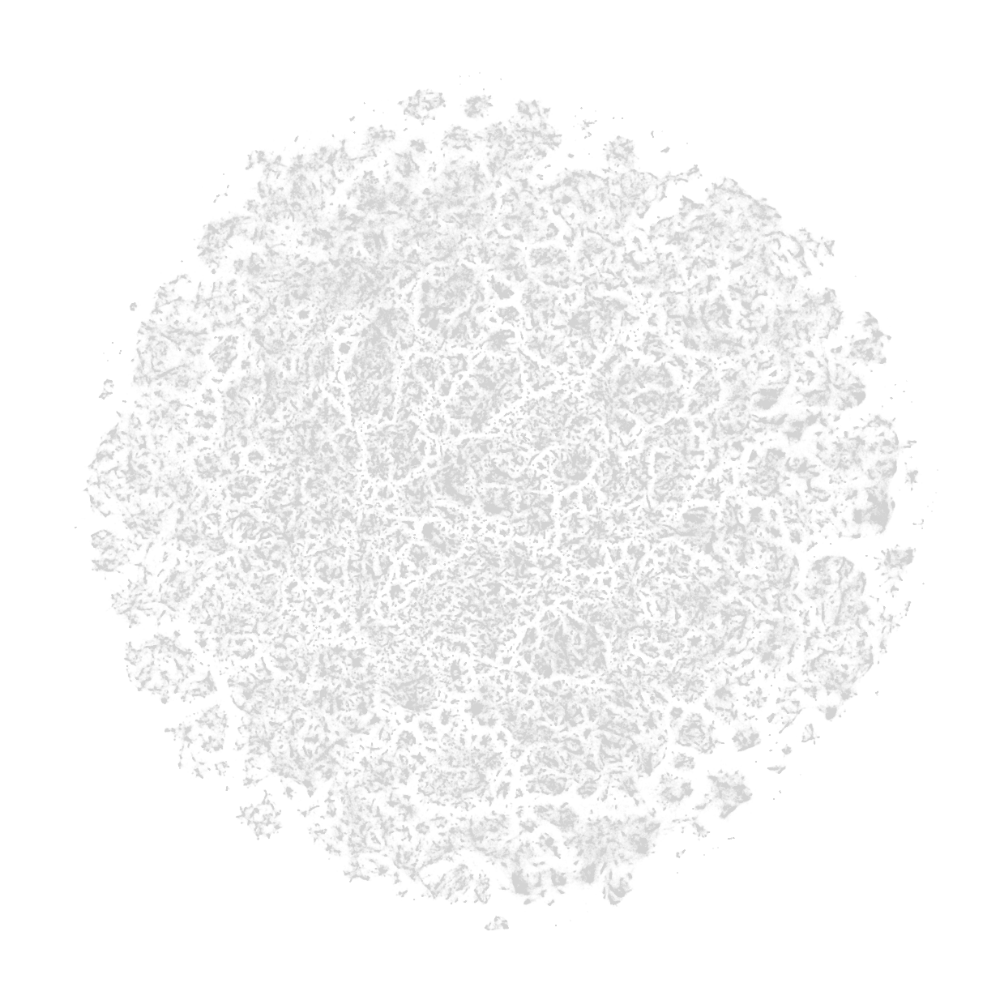

In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = tsne_sep
# all
ax.scatter(
    *tsne.T,
    c="lightgrey",
    s=s_grey,
    alpha=alpha_grey,
    marker=".",
    linewidths=0,
    rasterized=True,
    ec="None",
)

ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

### Colors based on class

In [ ]:
label_color_legend = {
    "cancer": "black",
    "neuroscience": "#aeaa00",
    "cardiology": "#1CE6FF",
    "ecology": "#FF34FF",
    "bioinformatics": "#FF4A46",
    "chemistry": "#008941",
    "surgery": "#006FA6",
    "environment": "#0089A3",
    "material": "#0000A6",
    "microbiology": "#B79762",
    "pediatric": "#004D43",
    "immunology": "#8FB0FF",
    "psychology": "#5A0007",
    "psychiatry": "#BA0900",
    "genetics": "#1B4400",
    "nutrition": "#4FC601",
    "veterinary": "#3B5DFF",
    "engineering": "#00C2A0",
    "education": "#549E79",
    "physics": "#BC23FF",
    "optics": "#C895C5",
    "nursing": "#FF2F80",
    "neurology": "#009271",
    "radiology": "#00FECF",
    "ophthalmology": "#A4E804",
    "gynecology": "#FFB500",
    "rehabilitation": "#6B002C",
    "pathology": "#FF9408",
    "anesthesiology": "#CC0744",
    "dermatology": "#D790FF",
    "pharmacology": "#5B4534",
    "physiology": "#E83000",
    "virology": "#6F0062",
    "biochemistry": "#b65141",
    "computation": "#C20078",
    "infectious": "#7A4900",
    "healthcare": "#FF90C9",
    "ethics": "#6508ba",
    "dentistry": "#8e4d8a",
}

In [ ]:
# mapping
# create colors
colors_class = np.vectorize(label_color_legend.get)(labels)

# add grey to the rest of papers
colors_class = np.where(colors_class == None, "lightgrey", colors_class)
colors_class = np.where(colors_class == "None", "lightgrey", colors_class)

# change 0 for 'unlabeled'
labels_with_unlabeled = np.where(
    colors_class == "lightgrey", "unlabeled", labels
)

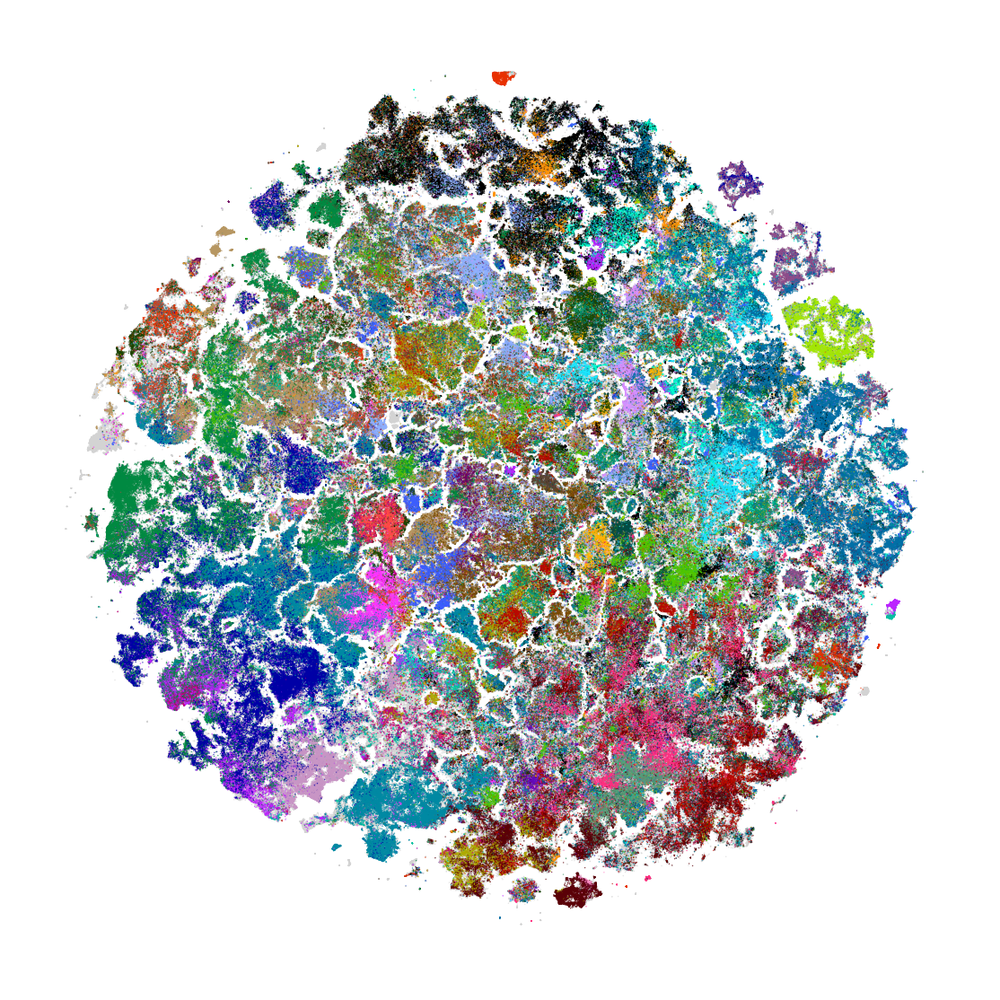

In [ ]:
fig, ax = plt.subplots(figsize=(3.6, 3.6), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

x_lim = (-120, 120)
y_lim = (-120, 120)
tsne = tsne_rot  # np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# subplot a
plot_tsne_colors(
    tsne,
    colors_class,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    # plot_type="subplot_2",
)

# fig.savefig(figures_path / "tsne_22-24_colored_by_class.png")

### Colors based on country

In [ ]:
country_color_legend = {
    "United States": "#1869ff",
    "China": "#d21820",
    "Japan": "#008a00",
    "United Kingdom": "#f36dff",
    "Germany": "#710079",
    "Italy": "#eba600",
    "Canada": "#00bec2",
    "France": "#45ef3d",
    "India": "#714900",
    "Australia": "#a2aeff",
}

In [ ]:
# mapping
# create colors
colors_country = np.vectorize(country_color_legend.get)(countries)

# add grey to the rest of papers
colors_country = np.where(colors_country == None, "lightgrey", colors_country)
colors_country = np.where(
    colors_country == "None", "lightgrey", colors_country
)

# change 0 for 'unlabeled'
labels_with_unlabeled = np.where(
    colors_country == "lightgrey", "unlabeled", countries
)

In [ ]:
%%time

# this makes all other countries in dark grey ("#474747") and the unknown ones in grey
colors_country_with_others = np.where(
    colors_country == "lightgrey",
    "#474747",
    colors_country,
)
colors_country_with_others = np.where(
    countries == "unknown",
    "lightgrey",
    colors_country_with_others,
)

CPU times: user 333 ms, sys: 72.9 ms, total: 406 ms
Wall time: 403 ms


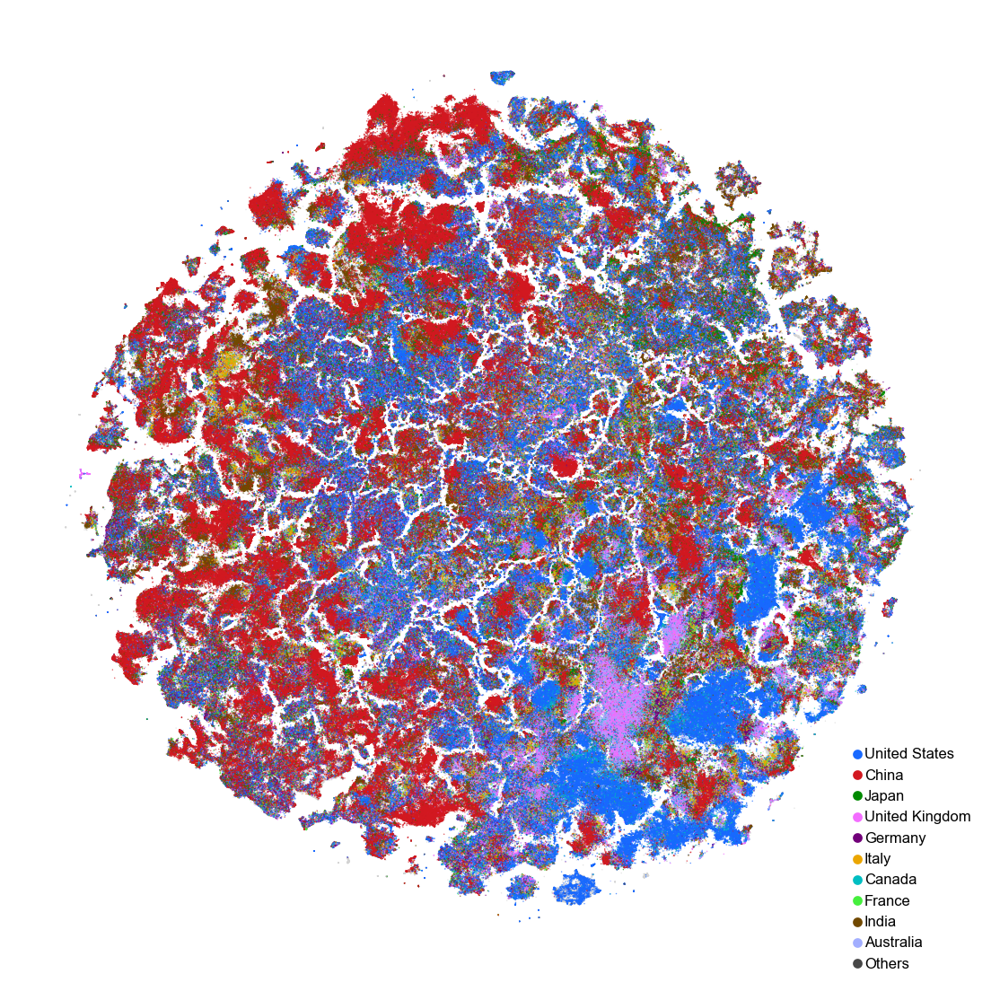

In [ ]:
fig, ax = plt.subplots(figsize=(3.6, 3.6), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

x_lim = (-120, 120)
y_lim = (-120, 120)

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T


# subplot a
plot_tsne_colors(
    tsne,
    colors_country,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    # plot_type="subplot_2",
)

all_keys = []
for key, value in country_color_legend.items():
    key = ax.scatter([], [], c=value, s=10, alpha=1, label=key)
    all_keys.append(key)

key = ax.scatter([], [], c="#474747", s=10, alpha=1, label="Others")
all_keys.append(key)
ax.legend(
    handles=all_keys,
    loc="lower right",
    fontsize=4,
    frameon=False,
    borderpad=0.2,
    handletextpad=0,
    handlelength=1,
    borderaxespad=-0.2,
)

fig.savefig(figures_path / "tsne_22-24_colored_by_country.png")

# Sets of words

In [ ]:
chatgptwords_common = [
    "exhibited",
    "crucial",
    "additionally",
    "within",
    "notably",
    "insights",
    "comprehensive",
    "across",
    "particularly",
    "enhancing",
]

chatgptwords_rare = [
    "accentuates",
    "acknowledges",
    "acknowledging",
    "addresses",
    "adept",
    "adhered",
    "adhering",
    "advancement",
    "advancements",
    "advancing",
    "advocates",
    "advocating",
    "affirming",
    "afflicted",
    "aiding",
    "akin",
    "align",
    "aligning",
    "aligns",
    "alongside",
    "amidst",
    "assessments",
    "attains",
    "attributed",
    "augmenting",
    "avenue",
    "avenues",
    "bolster",
    "bolstered",
    "bolstering",
    "broader",
    "burgeoning",
    "capabilities",
    "capitalizing",
    "categorized",
    "categorizes",
    "categorizing",
    "combating",
    "commendable",
    "compelling",
    "complicates",
    "complicating",
    "comprehending",
    "comprising",
    "consequently",
    "consolidates",
    "contributing",
    "conversely",
    "correlating",
    "crafted",
    "crafting",
    "culminating",
    "customizing",
    "delineates",
    "delve",
    "delved",
    "delves",
    "delving",
    "demonstrating",
    "dependability",
    "dependable",
    "detailing",
    "detrimentally",
    "diminishes",
    "diminishing",
    "discern",
    "discerned",
    "discernible",
    "discerning",
    "displaying",
    "disrupts",
    "distinctions",
    "distinctive",
    "elevate",
    "elevates",
    "elevating",
    "elucidate",
    "elucidates",
    "elucidating",
    "embracing",
    "emerges",
    "emphasises",
    "emphasising",
    "emphasize",
    "emphasizes",
    "emphasizing",
    "employing",
    "employs",
    "empowers",
    "emulating",
    "emulation",
    "enabling",
    "encapsulates",
    "encompass",
    "encompassed",
    "encompasses",
    "encompassing",
    "endeavors",
    "endeavours",
    "enduring",
    "enhancements",
    "enhances",
    "ensuring",
    "equipping",
    "escalating",
    "evaluates",
    "evolving",
    "exacerbating",
    "examines",
    "exceeding",
    "excels",
    "exceptional",
    "exceptionally",
    "exerting",
    "exhibiting",
    "exhibits",
    "expedite",
    "expediting",
    "exploration",
    "explores",
    "facilitated",
    "facilitates",
    "facilitating",
    "featuring",
    "formidable",
    "fostering",
    "fosters",
    "foundational",
    "furnish",
    "garnered",
    "garnering",
    "gauged",
    "grappling",
    "groundbreaking",
    "groundwork",
    "harness",
    "harnesses",
    "harnessing",
    "heighten",
    "heightened",
    "hinder",
    "hinges",
    "hinting",
    "hold",
    "holds",
    "illuminates",
    "illuminating",
    "imbalances",
    "impacting",
    "impede",
    "impeding",
    "imperative",
    "impressive",
    "inadequately",
    "incorporates",
    "incorporating",
    "influencing",
    "inherent",
    "initially",
    "innovative",
    "inquiries",
    "integrates",
    "integrating",
    "integration",
    "interconnectedness",
    "interplay",
    "intricacies",
    "intricate",
    "intricately",
    "introduces",
    "invaluable",
    "investigates",
    "involves",
    "juxtaposed",
    "leverages",
    "leveraging",
    "maintaining",
    "merges",
    "methodologies",
    "meticulous",
    "meticulously",
    "multifaceted",
    "necessitate",
    "necessitates",
    "necessitating",
    "necessity",
    "notable",
    "noteworthy",
    "nuanced",
    "nuances",
    "offering",
    "optimizing",
    "orchestrating",
    "outlines",
    "overlook",
    "overlooking",
    "paving",
    "persist",
    "pinpoint",
    "pinpointed",
    "pinpointing",
    "pioneering",
    "pioneers",
    "pivotal",
    "poised",
    "pose",
    "posed",
    "poses",
    "posing",
    "predominantly",
    "preserving",
    "pressing",
    "promise",
    "pronounced",
    "propelling",
    "realm",
    "realms",
    "recognizing",
    "refine",
    "refines",
    "refining",
    "remarkable",
    "renowned",
    "revealing",
    "reveals",
    "revolutionize",
    "revolutionizing",
    "revolves",
    "scrutinize",
    "scrutinized",
    "scrutinizing",
    "seamless",
    "seamlessly",
    "seeks",
    "serves",
    "serving",
    "shaping",
    "shedding",
    "showcased",
    "showcases",
    "showcasing",
    "signifying",
    "solidify",
    "spanned",
    "spanning",
    "spurred",
    "stands",
    "stemming",
    "strategically",
    "streamline",
    "streamlined",
    "streamlines",
    "streamlining",
    "struggle",
    "substantiated",
    "substantiates",
    "surged",
    "surmount",
    "surpass",
    "surpassed",
    "surpasses",
    "surpassing",
    "swift",
    "swiftly",
    "thorough",
    "transformative",
    "typically",
    "ultimately",
    "uncharted",
    "uncovering",
    "underexplored",
    "underscore",
    "underscored",
    "underscores",
    "underscoring",
    "unexplored",
    "unlocking",
    "unparalleled",
    "unraveling",
    "unveil",
    "unveiled",
    "unveiling",
    "unveils",
    "uphold",
    "upholding",
    "urging",
    "utilizes",
    "varying",
    "versatility",
    "warranting",
    "yielding",
]

In [ ]:
def find_mask_list_words(abstracts, list_word, verbose=True):
    """Creates a mask for abstracts containing at least one word of the list."""

    pattern = r"\b(?:" + "|".join(list_word) + r")\b"
    mask = abstracts.str.contains(pattern, case=False).to_numpy()

    if verbose == True:
        print(
            f"Number of papers with at least one of the words: ", np.sum(mask)
        )

    return mask

## Rare words

In [ ]:
%%time
mask_rare_words = find_mask_list_words(abstracts, chatgptwords_rare)
np.save(variables_path / "mask_rare_words", mask_rare_words)

Number of papers with at least one of the words:  1921674
CPU times: user 1h 9min 35s, sys: 3.07 s, total: 1h 9min 38s
Wall time: 1h 9min 47s


### 2024

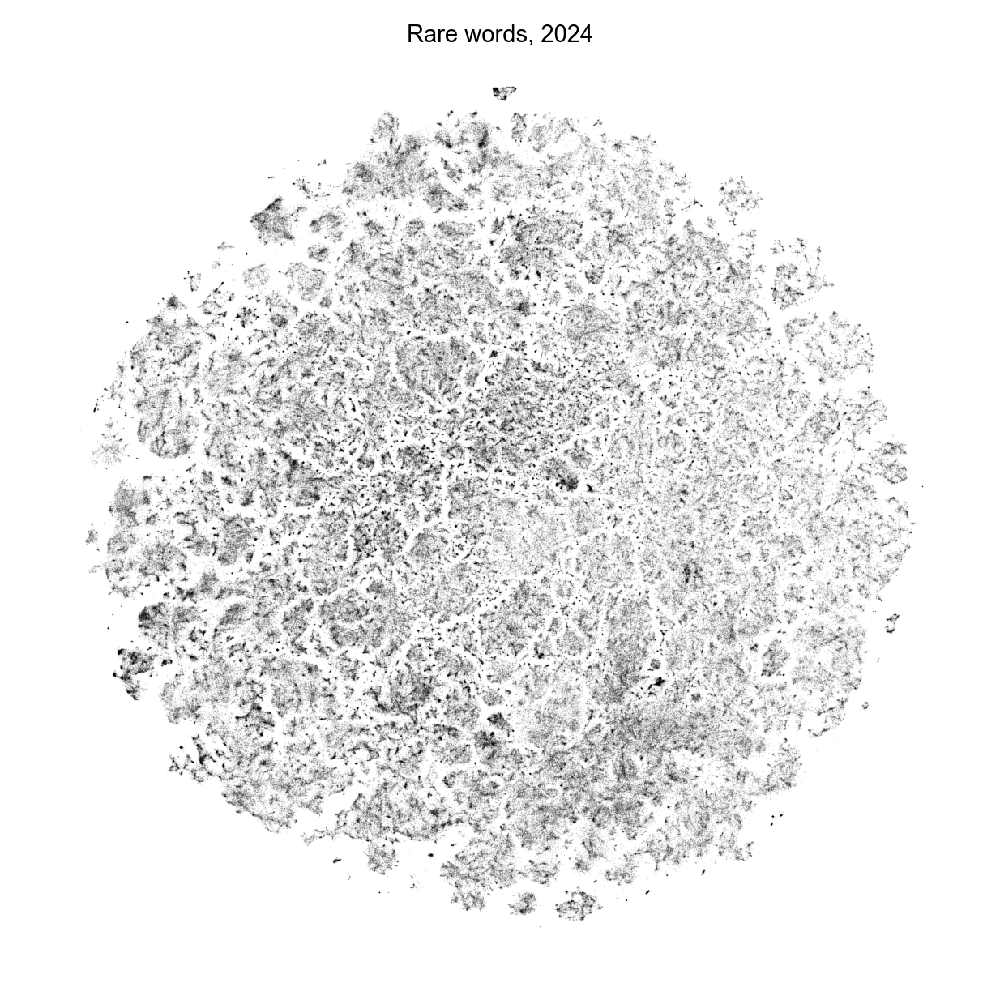

In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_rare_words) & (years == 2024)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Rare words, 2024")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_rare_words_2024_v1.png")

### 2022

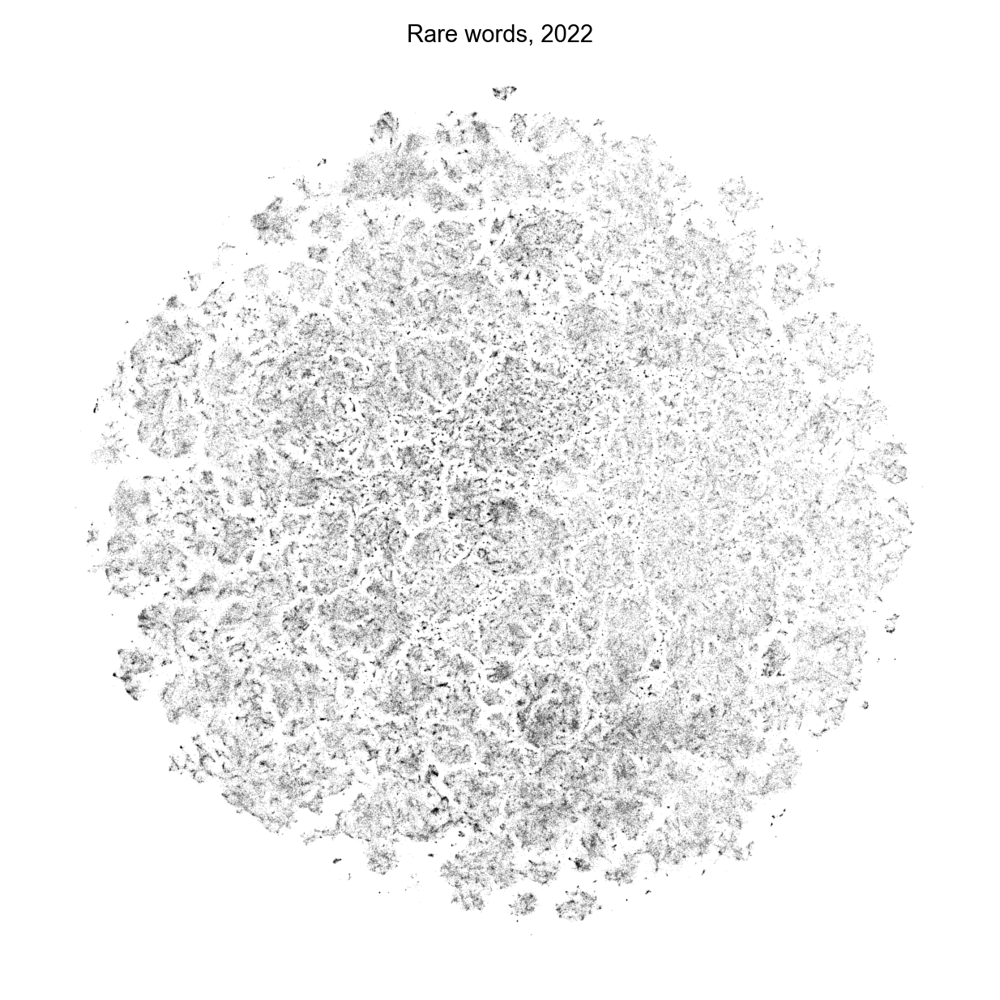

In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_rare_words) & (years == 2022)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Rare words, 2022")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_rare_words_2022_v1.png")

## Common words

In [ ]:
%%time
mask_common_words = find_mask_list_words(abstracts, chatgptwords_common)
np.save(variables_path / "mask_common_words", mask_common_words)

Number of papers with at least one of the words:  1537552
CPU times: user 3min 44s, sys: 2.18 s, total: 3min 46s
Wall time: 3min 47s


### 2024

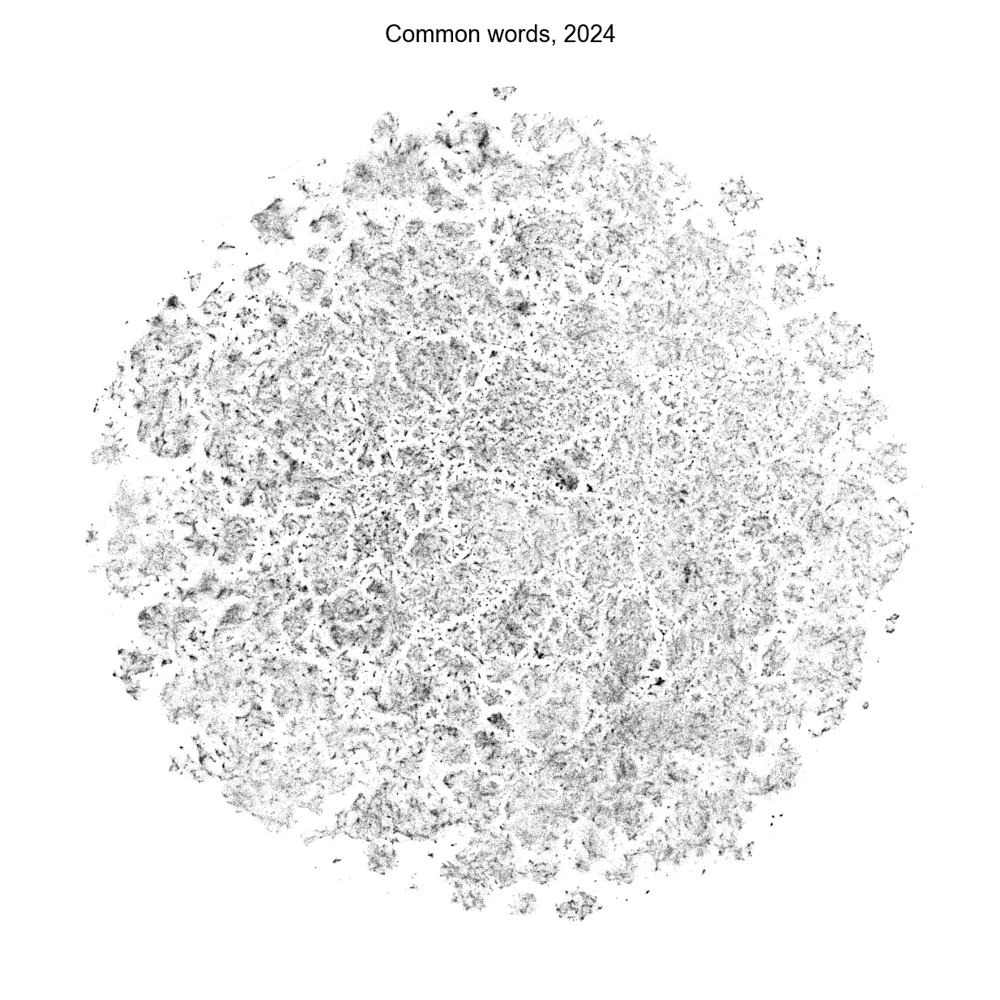

In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_common_words) & (years == 2024)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Common words, 2024")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_common_words_2024_v1.png")

### 2022

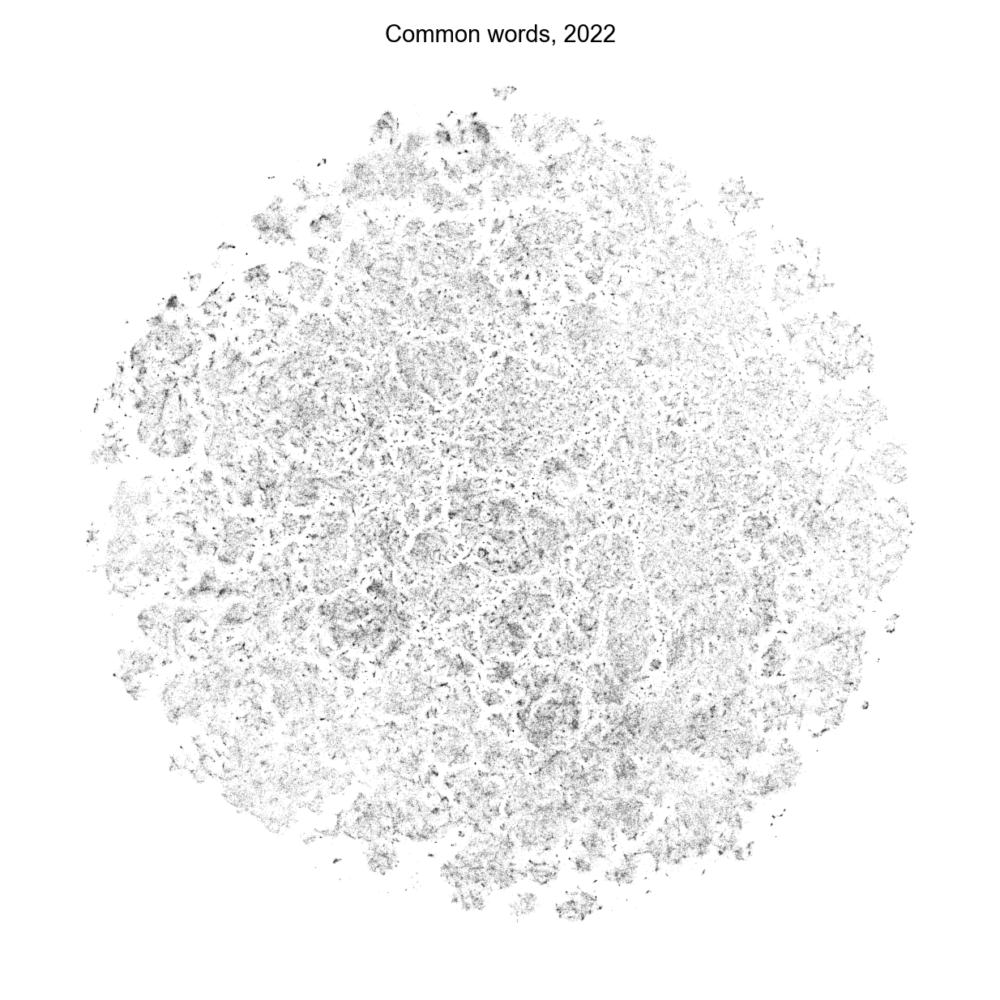

In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_common_words) & (years == 2022)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Common words, 2022")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_common_words_2022_v1.png")

# Dataframe

Only including papers from 2022-2024

PMID, x, y, country, colors, class, color, journal, year, contains_rare, contains_common

In [ ]:
mask_rare_words = np.load(variables_path / "mask_rare_words.npy")
mask_common_words = np.load(variables_path / "mask_common_words.npy")

In [ ]:
df_tsne = df[["PMID", "Title", "Year", "Journal", "Labels", "Countries"]][
    (df.Year >= 2022) & (df.Year <= 2024)
].copy(deep=True)

In [ ]:
df_tsne["x"] = tsne_rot[:, 0]
df_tsne["y"] = tsne_rot[:, 1]

In [ ]:
df_tsne["contains_rare"] = mask_rare_words

In [ ]:
df_tsne["contains_common"] = mask_common_words

In [ ]:
df_tsne["colors_class"] = colors_class

In [ ]:
df_tsne["colors_country"] = colors_country_with_others

In [ ]:
df_tsne.head()

,PMID,Title,Year,Journal,Labels,Countries,x,y,contains_rare,contains_common,colors_class,colors_country
3759007,17111134,Fabrication and application of carbohydrate mi...,2023,Applied microbiology and biotechnology,microbiology,China,-41.336465,14.301695,False,False,#B79762,#d21820
3862195,17245552,Molecular cloning and characterization of a cy...,2023,Molecular biology reports,unlabeled,China,-30.471647,21.530552,False,False,lightgrey,#d21820
6423822,20960239,Novel Cellulase Screening and Optimal Producti...,2024,Applied biochemistry and biotechnology,biochemistry,China,-61.087884,31.224746,False,True,#b65141,#d21820
6442209,21028883,Pulse Radiolysis Studies of Temperature Depend...,2022,Biochemistry,biochemistry,Denmark,-52.883743,36.074506,True,False,#b65141,#474747
6841810,21544554,Identification and Characterization of a Tryps...,2024,Applied biochemistry and biotechnology,biochemistry,China,-61.388757,32.332601,False,True,#b65141,#d21820


In [ ]:
type(df_tsne.PMID.iloc[0])

str

In [ ]:
df_tsne.shape[0]

4109080

In [ ]:
%%time
df_tsne.to_parquet(
    berenslab_data_path / "df_tsne_22_24.parquet.gzip",
    index=False,
    engine="pyarrow",
    compression="gzip",
)

CPU times: user 36.8 s, sys: 597 ms, total: 37.4 s
Wall time: 37.5 s
